In [43]:
from PIL import Image
import os, os.path
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
from skimage import (color, feature, filters, measure, morphology, segmentation, util, draw)
from moviepy.editor import ImageSequenceClip, concatenate_videoclips
from IPython.display import display
from IPython.display import Image as Img

In [14]:
image = io.imread("Desktop/noname-cutout.png")

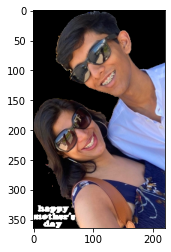

In [54]:
plt.imshow(image[:,:,:3])

In [38]:
def animate(image, levels):
    img = color.rgb2gray(image)
    fig, ax = plt.subplots(figsize=(25, 35))
    qcs = ax.contour(img, origin='image', levels = levels)
    contoured = [np.zeros(image.shape, dtype = 'uint8')]
    cim = np.copy(np.flipud(image))
    img = np.flipud(img)
    paths = []
    for p in qcs.collections[1:]:
        paths += p.get_paths()
    for i in sorted(paths, key = lambda p : -p.vertices.shape[0]):
        vs = i.vertices
        r = vs[:,0]
        c = vs[:,1]
        rr, cc = draw.polygon(r,c)
        if len(cc) > 0 and len(rr) > 0:
            new = np.copy(contoured[-1])
            new[cc, rr, 0] = np.mean(cim[cc, rr, 0])
            contoured.append(new)
            new = np.copy(contoured[-1])
            new[cc, rr, 1] = np.mean(cim[cc, rr, 1])
            contoured.append(new)
            new[cc, rr, 2] = np.mean(cim[cc, rr, 2])
            new = np.copy(contoured[-1])
            new[cc, rr, 3] = cim[cc, rr, 3]
            contoured.append(new)
    
    new = np.copy(new)
    for i in range(1, cim.shape[0] - 1):
        for j in range(1, cim.shape[1] - 1):
            if cim[i, j, 3] and not new[i, j, 3]:
                for k in range(3):
                    a, b = 0,0
                    for c in (-1,0,1):
                        for d in (-1,0,1):
                            if cim[i + c, j + d, k] and new[i + c, j + d, k]>a:
                                a = new[i + c, j + d, k]
                                b += 1
                    if b:
                        new[i,j,k] = a
                if new[i,j].any():
                    new[i,j,3] = 255
    contoured.append(new)
    
    for c in contoured:
        c[c[:,:,3] == 0] = 0
        
    return contoured

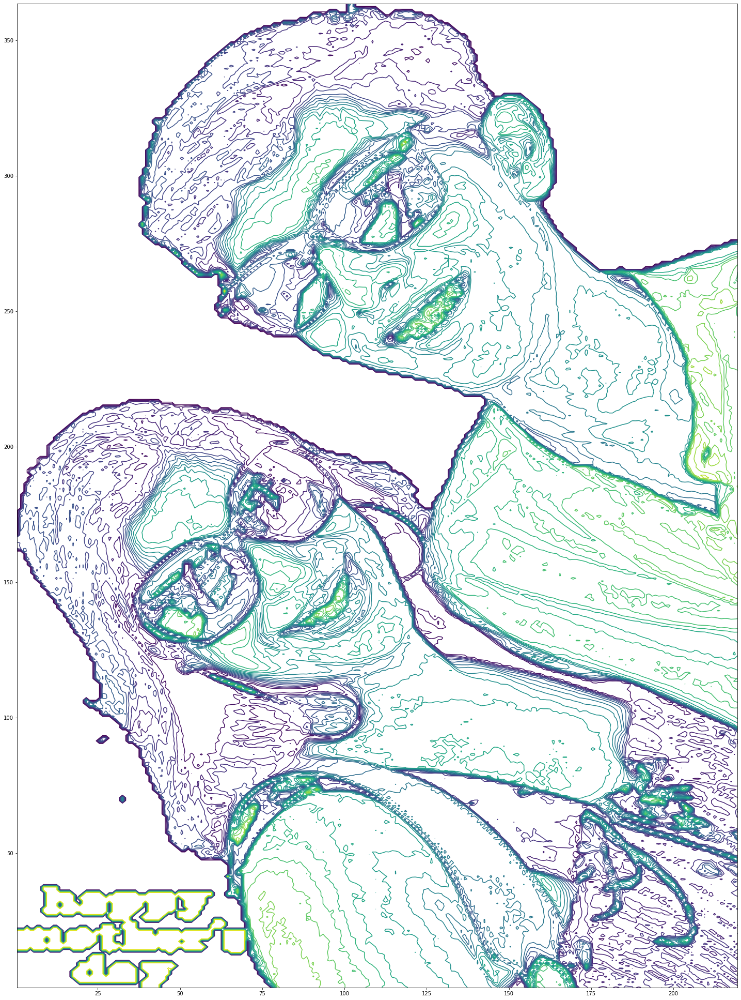

In [48]:
contoured = []
contoured = animate(image, 20)
n = len(contoured)
for i in range(n//4):
    contoured.append(np.flipud(contoured[n - 1]))

In [51]:
clip1 = ImageSequenceClip(contoured[:100], fps=20)
clip2 = ImageSequenceClip(contoured[100:200], fps=40)
clip3 = ImageSequenceClip(contoured[200:1000], fps=160)
clip4 = ImageSequenceClip(contoured[1000:], fps=600)
clip = concatenate_videoclips([clip1, clip2, clip3, clip4])
clip.write_gif('test.gif', fps=30)

t:   3%|▎         | 18/557 [00:00<00:03, 177.63it/s, now=None]

MoviePy - Building file test.gif with imageio.


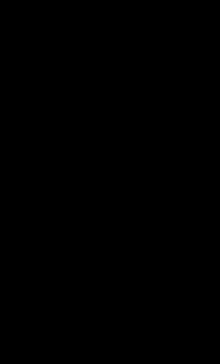

In [57]:
Img('test.gif', width=2200, height=3640)